# Proyek Recommender System: [BoardGameGeek Reviews Dataset]
- **Nama:** Rizka Alfadilla
- **Email:** rizkaal874@gmail.com
- **ID Dicoding:** rizka_alfadilla

## Import Semua Packages/Library yang Digunakan

Pada bagian ini, dilakukan import seluruh library yang akan digunakan dalam proyek ini. Library yang digunakan meliputi Pandas, Matplotlib, Seaborn, dan library machine learning dari scikit-learn dan tensorflow.

In [ ]:
# Library yang sering digunakan
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
# Library machine learning
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Hubungkan google drive dengan google colab
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


## Data Understanding

Dataset = https://www.kaggle.com/datasets/jvanelteren/boardgamegeek-reviews/data

Dataset diunduh dari Kaggle (BoardGameGeek Reviews Dataset). Dataset ini berisi kumpulan ulasan (reviews) pengguna tentang board game yang dikumpulkan dari situs BoardGameGeek (BGG) — situs terbesar di dunia untuk penggemar board game.

### Data Loading

Memuat dataset dari google drive untuk digunakan.

In [ ]:
df_game = pd.read_csv('drive/MyDrive/data/rekomendasi/games_detailed_info.csv', index_col=0)
df_game.head()

<ipython-input-4-18c2c87c2ed5>:1: DtypeWarning: Columns (29,48) have mixed types. Specify dtype option on import or set low_memory=False.
  df_game = pd.read_csv('drive/MyDrive/data/rekomendasi/games_detailed_info.csv', index_col=0)


,type,id,thumbnail,image,primary,alternate,description,yearpublished,minplayers,maxplayers,...,War Game Rank,Customizable Rank,Children's Game Rank,RPG Item Rank,Accessory Rank,Video Game Rank,Amiga Rank,Commodore 64 Rank,Arcade Rank,Atari ST Rank
0,boardgame,30549,https://cf.geekdo-images.com/S3ybV1LAp-8SnHIXL...,https://cf.geekdo-images.com/S3ybV1LAp-8SnHIXL...,Pandemic,"['EPIZOotic', 'Pandemia', 'Pandemia 10 Anivers...","In Pandemic, several virulent diseases have br...",2008,2,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,boardgame,822,https://cf.geekdo-images.com/okM0dq_bEXnbyQTOv...,https://cf.geekdo-images.com/okM0dq_bEXnbyQTOv...,Carcassonne,"['Carcassonne Jubilee Edition', 'Carcassonne: ...",Carcassonne is a tile-placement game in which ...,2000,2,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,boardgame,13,https://cf.geekdo-images.com/W3Bsga_uLP9kO91gZ...,https://cf.geekdo-images.com/W3Bsga_uLP9kO91gZ...,Catan,"['CATAN', 'Catan (Колонизаторы)', 'Catan telep...","In CATAN (formerly The Settlers of Catan), pla...",1995,3,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,boardgame,68448,https://cf.geekdo-images.com/RvFVTEpnbb4NM7k0I...,https://cf.geekdo-images.com/RvFVTEpnbb4NM7k0I...,7 Wonders,"['7 csoda', '7 Cudów Świata', '7 divů světa', ...",You are the leader of one of the 7 great citie...,2010,2,7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,boardgame,36218,https://cf.geekdo-images.com/j6iQpZ4XkemZP07HN...,https://cf.geekdo-images.com/j6iQpZ4XkemZP07HN...,Dominion,"['Dominion: Basisspiel', 'Dominion: In naam va...","&quot;You are a monarch, like your parents bef...",2008,2,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_review = pd.read_csv('drive/MyDrive/data/rekomendasi/bgg-15m-reviews.csv', index_col=0)
df_review.head()

,user,rating,comment,ID,name
0,Torsten,10.0,NaN,30549,Pandemic
1,mitnachtKAUBO-I,10.0,Hands down my favorite new game of BGG CON 200...,30549,Pandemic
2,avlawn,10.0,I tend to either love or easily tire of co-op ...,30549,Pandemic
3,Mike Mayer,10.0,NaN,30549,Pandemic
4,Mease19,10.0,This is an amazing co-op game. I play mostly ...,30549,Pandemic


### Exploratory Data Analysis (EDA)

Pada bagian ini, dilakukan EDA untuk memahami distribusi data dan missing values. Visualisasi menggunakan Seaborn dan Matplotlib.

In [ ]:
df_game.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21631 entries, 0 to 21630
Data columns (total 55 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   type                           21631 non-null  object 
 1   id                             21631 non-null  int64  
 2   thumbnail                      21616 non-null  object 
 3   image                          21616 non-null  object 
 4   primary                        21631 non-null  object 
 5   alternate                      8850 non-null   object 
 6   description                    21630 non-null  object 
 7   yearpublished                  21631 non-null  int64  
 8   minplayers                     21631 non-null  int64  
 9   maxplayers                     21631 non-null  int64  
 10  suggested_num_players          21631 non-null  object 
 11  suggested_playerage            21520 non-null  object 
 12  suggested_language_dependence  21559 non-null  obje

Dataset ini memiliki 21.631 sampel dengan 55 fitur yang terdiri dari 21 fitur kategorikal (`object`), 18 fitur numerik kontinu (`float64`), dan 16 fitur numerik diskrit (`int64`). Beberapa fitur juga memiliki nilai kosong (missing values) dalam jumlah signifikan, misalnya fitur `alternate`, `boardgamemechanic`, dan `boardgameartist`. Dataset ini adalah metadata detail tentang board game, bukan review dari pengguna secara langsung, tapi lebih ke informasi deskriptif dari masing-masing permainan.


In [ ]:
df_review.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15823269 entries, 0 to 15823268
Data columns (total 5 columns):
 #   Column   Dtype  
---  ------   -----  
 0   user     object 
 1   rating   float64
 2   comment  object 
 3   ID       int64  
 4   name     object 
dtypes: float64(1), int64(1), object(3)
memory usage: 724.3+ MB


Dataset ini memiliki 15.823.269 sampel dengan 5 fitur, terdiri dari 3 fitur kategorikal (`object`) yaitu `user`, `comment`, dan `name`, 1 fitur numerik kontinu (`float64`) yaitu `rating`, serta 1 fitur numerik diskrit (`int64`) yaitu `ID`. Dataset ini berisi data ulasan pengguna terhadap berbagai board game, skala datanya juga sangat besar sehingga memakan banyak memori.


In [ ]:
df_game.describe()

,id,yearpublished,minplayers,maxplayers,playingtime,minplaytime,maxplaytime,minage,usersrated,average,...,Thematic Rank,War Game Rank,Customizable Rank,RPG Item Rank,Accessory Rank,Video Game Rank,Amiga Rank,Commodore 64 Rank,Arcade Rank,Atari ST Rank
count,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,21631.000000,...,1235.000000,3501.000000,301.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,118133.093847,1986.094910,2.007027,5.709491,90.509177,63.647774,90.509177,9.611391,875.000693,6.417127,...,618.134413,1765.025421,151.405316,347.0,140.0,5374.0,227.0,180.0,170.0,140.0
std,105310.419253,210.042496,0.688957,15.102385,534.826511,447.213702,534.826511,3.640562,3697.681390,0.929178,...,356.859805,1025.206714,87.555326,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,-3500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.000000,1.041330,...,1.000000,1.000000,1.000000,347.0,140.0,5374.0,227.0,180.0,170.0,140.0
25%,12280.500000,2001.000000,2.000000,4.000000,25.000000,20.000000,25.000000,8.000000,57.000000,5.832710,...,309.500000,876.000000,76.000000,347.0,140.0,5374.0,227.0,180.0,170.0,140.0
50%,105187.000000,2011.000000,2.000000,4.000000,45.000000,30.000000,45.000000,10.000000,124.000000,6.446360,...,618.000000,1758.000000,151.000000,347.0,140.0,5374.0,227.0,180.0,170.0,140.0
75%,207013.000000,2017.000000,2.000000,6.000000,90.000000,60.000000,90.000000,12.000000,397.000000,7.039515,...,926.500000,2652.000000,227.000000,347.0,140.0,5374.0,227.0,180.0,170.0,140.0
max,350992.000000,2023.000000,10.000000,999.000000,60000.000000,60000.000000,60000.000000,25.000000,109006.000000,9.568290,...,1236.000000,3546.000000,303.000000,347.0,140.0,5374.0,227.0,180.0,170.0,140.0


Beberapa fitur menunjukkan distribusi yang luas dan kemungkinan adanya outlier, contohnya `playingtime`, `minplaytime`, dan `maxplaytime` yang memiliki nilai maksimum hingga 60.000 menit, jauh di atas nilai 75% yaitu 90 menit. Fitur `yearpublished` memiliki nilai minimum ekstrem -3500 yang tampaknya merupakan data error atau artefak historis. Sebagian besar ranking genre seperti `Thematic Rank`, `War Game Rank`, dan `Customizable Rank` hanya terisi sebagian kecil game, dengan fitur seperti `RPG Item Rank`, `Accessory Rank`, dan lainnya hanya memiliki satu nilai unik (tanpa variasi), yang membuatnya kurang informatif dan berpotensi dihapus.

In [ ]:
df_review.describe()

,rating,ID
count,1.582327e+07,1.582327e+07
mean,7.054843e+00,9.507796e+04
std,1.599649e+00,8.411524e+04
min,1.401300e-45,1.000000e+00
25%,6.000000e+00,1.213400e+04
50%,7.000000e+00,7.644400e+04
75%,8.000000e+00,1.677910e+05
max,1.000000e+01,3.140400e+05


Fitur `rating` memiliki nilai rata-rata sebesar **7,05** dengan standar deviasi sekitar **1,6**, yang menunjukkan bahwa sebagian besar game mendapatkan penilaian yang cenderung positif dari pengguna. Nilai median berada di **7**, dengan kuartil bawah dan atas di **6** dan **8**, sehingga distribusinya simetris dan terpusat.


In [ ]:
def summarize_dataframe(df, sample_unique=5):
    summary = pd.DataFrame({
        "Tipe Data": df.dtypes,
        "Jumlah Data": df.count(),
        "Jumlah Missing": df.isnull().sum(),
        "Jumlah Unik": df.nunique(),
        "Contoh Nilai Unik": [df[col].dropna().unique()[:sample_unique].tolist() for col in df.columns]
    })

    return summary

In [ ]:
summarize_dataframe(df_game)

,Tipe Data,Jumlah Data,Jumlah Missing,Jumlah Unik,Contoh Nilai Unik
type,object,21631,0,1,[boardgame]
id,int64,21631,0,21631,"[30549, 822, 13, 68448, 36218]"
thumbnail,object,21616,15,21615,[https://cf.geekdo-images.com/S3ybV1LAp-8SnHIX...
image,object,21616,15,21615,[https://cf.geekdo-images.com/S3ybV1LAp-8SnHIX...
primary,object,21631,0,21236,"[Pandemic, Carcassonne, Catan, 7 Wonders, Domi..."
alternate,object,8850,12781,8836,"[['EPIZOotic', 'Pandemia', 'Pandemia 10 Aniver..."
description,object,21630,1,21615,"[In Pandemic, several virulent diseases have b..."
yearpublished,int64,21631,0,190,"[2008, 2000, 1995, 2010, 2004]"
minplayers,int64,21631,0,11,"[2, 3, 1, 5, 4]"
maxplayers,int64,21631,0,52,"[4, 5, 7, 8, 2]"


Beberapa kolom seperti `boardgameexpansion`, `boardgameimplementation`, dan `boardgameintegration` memiliki proporsi missing value yang sangat besar (lebih dari 70%). Fitur `boardgamecategory`, `boardgamemechanic`, dan `boardgamefamily` memiliki jumlah data unik yg cukup banyak serta mengandung informasi tematik dan mekanisme gameplay, sehingga dapat digunakan sebagai fitur untuk membangun sistem content-based recommendation.




In [ ]:
summarize_dataframe(df_review)

,Tipe Data,Jumlah Data,Jumlah Missing,Jumlah Unik,Contoh Nilai Unik
user,object,15823203,66,351048,"[Torsten, mitnachtKAUBO-I, avlawn, Mike Mayer,..."
rating,float64,15823269,0,10172,"[10.0, 9.9, 9.8, 9.75, 9.5]"
comment,object,2995022,12828247,2733414,[Hands down my favorite new game of BGG CON 20...
ID,int64,15823269,0,19330,"[30549, 822, 13, 68448, 36218]"
name,object,15823269,0,18984,"[Pandemic, Carcassonne, Catan, 7 Wonders, Domi..."


Kolom `rating` lengkap tanpa missing dan memiliki nilai detail, cocok untuk collaborative filtering. Kolom `comment` memiliki missing value sangat tinggi (>80%), tapi bisa dimanfaatkan untuk analisis sentimen jika diperlukan. Data ini dapat digunakan untuk membangun sistem rekomendasi collaborative filtering.

In [ ]:
print("Jumlah duplikasi data game: ", df_game.duplicated().sum())
print("Jumlah duplikasi data review: ", df_review.duplicated().sum())

Jumlah duplikasi data game:  0
Jumlah duplikasi data review:  0


Dalam kedua dataset yang akan digunakan tidak ditemukan data yang double atau duplikat.

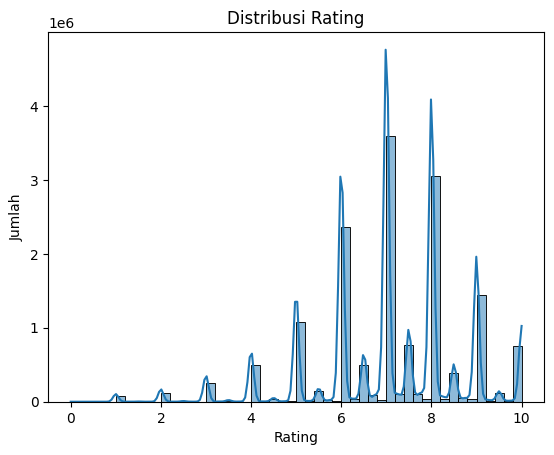

In [ ]:
sns.histplot(df_review['rating'], bins=50, kde=True)
plt.title('Distribusi Rating')
plt.xlabel('Rating')
plt.ylabel('Jumlah')
plt.show()

Distribusi rating ditampilkan untuk memahami pola penilaian pengguna secara keseluruhan, mengidentifikasi skewness data, serta mendeteksi outlier atau ketidakseimbangan pada nilai rating. Terlihat bahwa sistribusi rating  sangat terpusat pada bagian kanan. Ini menunjukkan adanya skewness ke arah rating positif, yang umum terjadi pada data ulasan pengguna.

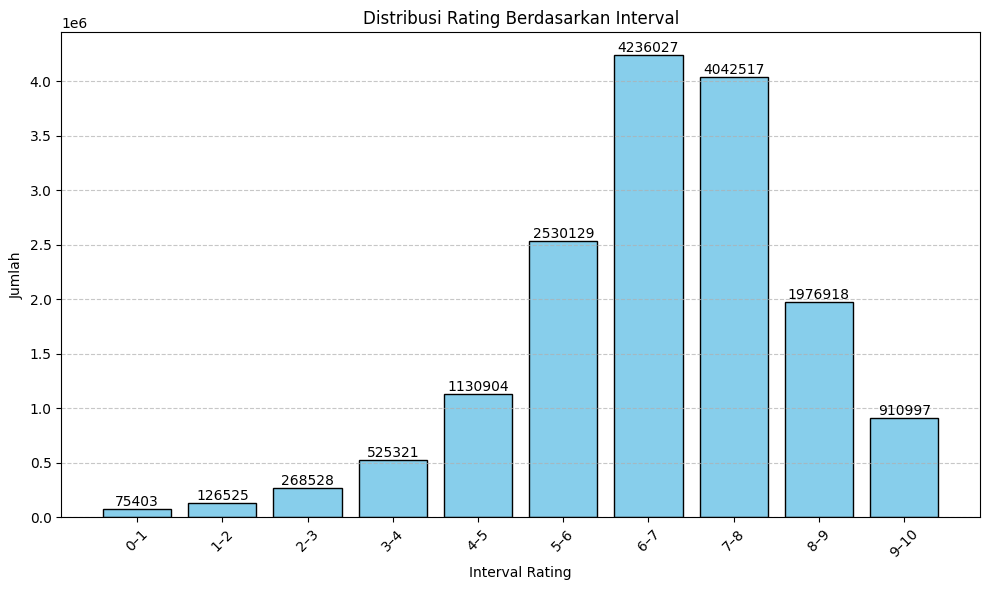

In [ ]:
# Bagi rating menjadi interval
bins = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
labels = ['0–1', '1–2', '2–3', '3–4', '4–5', '5–6', '6–7', '7–8', '8–9', '9–10']
df_review['rating_bin'] = pd.cut(df_review['rating'], bins=bins, labels=labels, include_lowest=True, right=True)

# Hitung frekuensi
interval_counts = df_review['rating_bin'].value_counts().sort_index()

# Buat Diagramnya
plt.figure(figsize=(10, 6))
bars = plt.bar(interval_counts.index, interval_counts.values, color='skyblue', edgecolor='black')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height, f'{int(height)}', ha='center', va='bottom')
plt.title('Distribusi Rating Berdasarkan Interval')
plt.xlabel('Interval Rating')
plt.ylabel('Jumlah')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Distribusi rating menunjukkan bahwa sebagian besar rating berada pada rentang 6–8, dengan puncak tertinggi pada interval 6–7 dan 7–8, masing-masing melebihi 4 juta entri. Hal ini mengindikasikan bahwa pengguna cenderung memberikan penilaian positif.

10 Game dengan Jumlah Rating Terbanyak
        game_name  rating_count
0        Pandemic         96234
1     Carcassonne         96221
2           Catan         96185
3       7 Wonders         79870
4        Dominion         74954
5  Ticket to Ride         67981
6       Codenames         62576
7        Agricola         61601
8     Puerto Rico         61158
9     Small World         59217



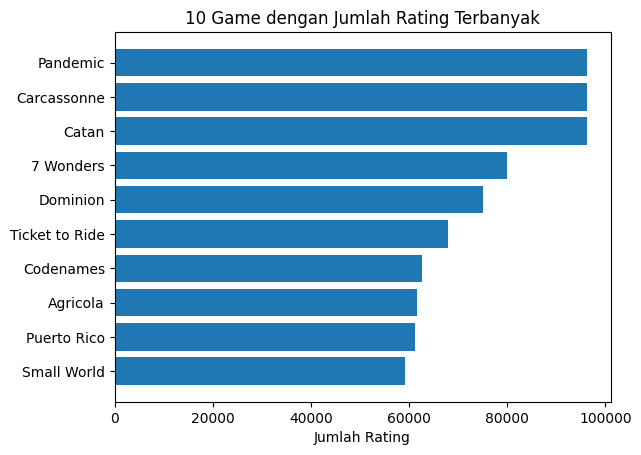

In [ ]:
# Hitung jumlah rating per game
rating_per_game = df_review['name'].value_counts().reset_index()
rating_per_game.columns = ['game_name', 'rating_count']

# Tampilkan 10 game teratas yang paling banyak diberi rating
print("10 Game dengan Jumlah Rating Terbanyak")
print(rating_per_game.head(10))
print()

top_games = rating_per_game.head(10)
plt.barh(top_games['game_name'][::-1], top_games['rating_count'][::-1])
plt.xlabel('Jumlah Rating')
plt.title('10 Game dengan Jumlah Rating Terbanyak')
plt.show()

Menampilkan 10 game dengan jumlah rating terbanyak untuk mengidentifikasi game-game paling populer berdasarkan keterlibatan pengguna (user engagement). Game seperti Pandemic, Carcassonne, dan Catan memiliki basis pengguna yang sangat besar dan aktif, sehingga perlu diperhatikan lebih apakah mungkin dapat mempengaruhi sistem rekomendasi secara signifikan atau tidak.

user
leffe dubbel    6027
TomVasel        4950
Doel            4876
warta           4811
Hessu68         4602
                ... 
kaiokvieira        1
Taytson            1
Mioperj            1
gabe_bilo          1
Catsnmaths         1
Name: count, Length: 351048, dtype: int64



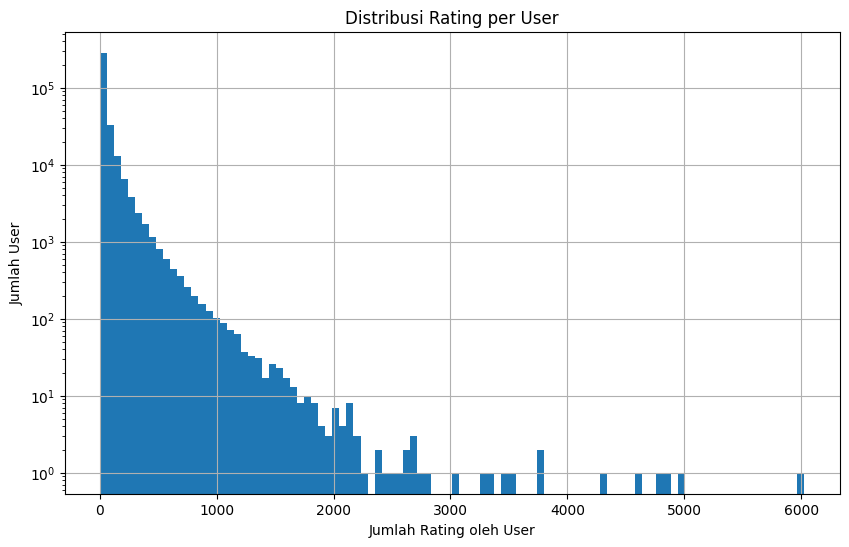

In [ ]:
rating_per_user = df_review['user'].value_counts()

print(rating_per_user)
print()

rating_per_user.hist(bins=100, figsize=(10, 6))
plt.xlabel('Jumlah Rating oleh User')
plt.ylabel('Jumlah User')
plt.title('Distribusi Rating per User')
plt.yscale('log')  # Biar terlihat distribusi long-tail
plt.grid(True)
plt.show()

Terdapat sebagian kecil pengguna (seperti leffe dubbel, TomVasel, dan Doel) yang memberikan ribuan rating, sementara mayoritas pengguna hanya memberikan satu rating. Hal ini mengonfirmasi adanya distribusi long-tail yang sangat ekstrem. Berdasarkan ini memunculkan kecurigaan adanya banyak data yang dapat dianggap sebagai outlier.


In [ ]:
# Hitung jumlah rating per user
rating_per_user = df_review['user'].value_counts().reset_index()
rating_per_user.columns = ['user', 'rating_count']

# Ekstrak nilai jumlah rating
data_rating = rating_per_user['rating_count']

# Hitung Q1 dan Q3
q25_rating, q75_rating = np.percentile(data_rating, 25), np.percentile(data_rating, 75)

# Hitung IQR
iqr_rating = q75_rating - q25_rating

# Tentukan batas bawah dan atas
cut_off = iqr_rating * 1.5
minimum_rating = q25_rating - cut_off
maximum_rating = q75_rating + cut_off

# Deteksi user outlier
outlier_users_df = rating_per_user[
    (rating_per_user["rating_count"] < minimum_rating) |
    (rating_per_user["rating_count"] > maximum_rating)
]

# Filter data review yang berasal dari user outlier
df_review_outlier = df_review[df_review['user'].isin(outlier_users_df['user'])]

print(f"Jumlah data outlier: {len(df_review_outlier)}")
print(f"Jumlah User Outlier: {len(outlier_users_df)}")
outlier_users_df.head()

Jumlah data outlier: 9673842
Jumlah User Outlier: 38214


,user,rating_count
0,leffe dubbel,6027
1,TomVasel,4950
2,Doel,4876
3,warta,4811
4,Hessu68,4602


Terdapat 38.214 user yang dianggap sebagai outlier yang menghasilkan sekitar 9,6 juta data review—jumlah yang signifikan dan dapat menyebabkan bias pada model jika tidak ditangani. Langkah selanjutnya adalah mengevaluasi apakah outlier ini akan dihapus, dipisahkan, atau diberi perlakuan khusus (misalnya diberi bobot) tergantung pada pendekatan sistem rekomendasi yang akan dibangun, agar model tetap adil dan tidak terlalu condong ke aktivitas pengguna ekstrem.

## Data Preparation

### Data Preprocessing

Pada tahap ini, dilakukan preprocessing data. Langkah-langkah yang dilakukan meliputi penghapusan data outlier, kolom yang tidak relevan,  missing value dan penggabungan dataset.


Jumlah data awal: 15823269
Jumlah data setelah outlier dihapus: 6149427

user
Dinoman73          104
syfon              104
Warbanner          104
freecs             104
tommatty           104
                  ... 
Alexandre AV7        1
kazupoh              1
mario100484          1
Michale Gantner      1
splatski             1
Name: count, Length: 312834, dtype: int64



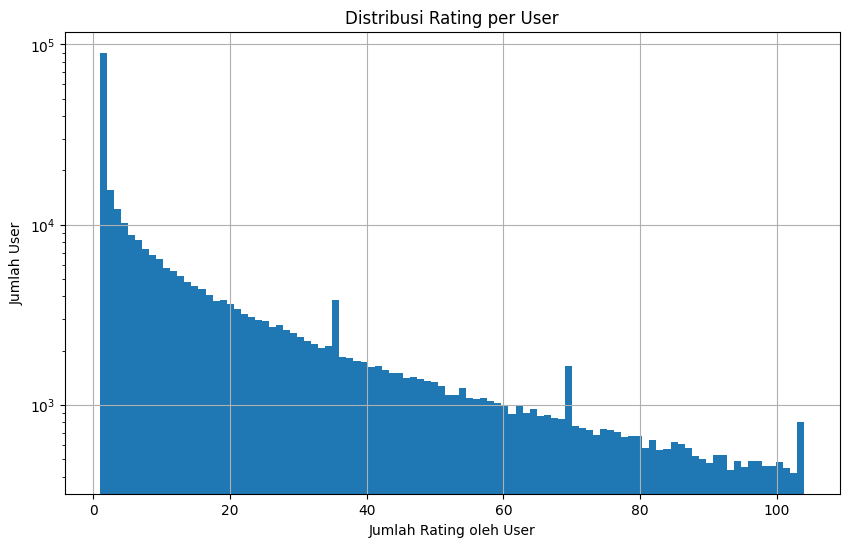

In [ ]:
# Buat DataFrame baru tanpa review dari user outlier
df_review_cleaned = df_review[~df_review['user'].isin(outlier_users_df['user'])]

# Cek hasilnya
print("Jumlah data awal:", len(df_review))
print(f"Jumlah data setelah outlier dihapus: {len(df_review_cleaned)}\n")

rating_per_user = df_review_cleaned['user'].value_counts()

print(rating_per_user)
print()

rating_per_user.hist(bins=100, figsize=(10, 6))
plt.xlabel('Jumlah Rating oleh User')
plt.ylabel('Jumlah User')
plt.title('Distribusi Rating per User')
plt.yscale('log')
plt.grid(True)
plt.show()

Penghapusan data outlier dilakukan untuk membersihkan data dari aktivitas pengguna yang terlalu ekstrem, baik yang memberikan terlalu banyak maupun terlalu sedikit rating, agar model rekomendasi tidak terdistorsi oleh bias interaksi yang tidak representatif. Setelah pembersihan, jumlah data berkurang drastis dari 15,8 juta menjadi 6,1 juta, yang menunjukkan bahwa sebagian besar interaksi berasal dari user outlier. Langkah ini bertujuan untuk meningkatkan kualitas data pelatihan dengan menjaga distribusi interaksi yang lebih seimbang dan realistis, serta mengurangi risiko overfitting terhadap preferensi segelintir pengguna super aktif.

In [ ]:
# Mengambil kolom yang dibutuhkan
df_review_filtered = df_review_cleaned[['user', 'rating', 'ID']].copy()
df_review_filtered.rename(columns={'ID': 'gameId', 'user': 'username'}, inplace=True)
df_review_filtered.reset_index(drop=True, inplace=True)

# Mengatasi missing value
print("Jumlah Missing:")
print(df_review_filtered.isnull().sum())
print()
df_review_filtered.dropna(inplace=True)

# Cek data
print(df_review_filtered.info(verbose=True, show_counts=True))
df_review_filtered.sample(5)

Jumlah Missing:
username    66
rating       0
gameId       0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
Index: 6149361 entries, 0 to 6149426
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   username  6149361 non-null  object 
 1   rating    6149361 non-null  float64
 2   gameId    6149361 non-null  int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 187.7+ MB
None


,username,rating,gameId
4844448,helioshyperion86,6.0,180564
355062,yvanjean,9.5,13
3427848,RetroShock,5.0,2425
4215934,georgeiosif90,7.7,216459
1770026,Avlalentin,7.0,148228


Pada tahap ini dipilih kolom yang relevan (user, game ID, dan rating), mengganti nama kolom agar lebih konsisten dan mudah digunakan dalam pipeline juga meringankan beban komputasi, serta menghapus data yang mengandung missing values untuk menghindari error atau bias dalam proses training.

In [ ]:
# Ambil kolom yang diperlukan
df_game_filtered = df_game[['id', 'primary', 'boardgamecategory']].copy()

# Ganti nama kolom
df_game_filtered.rename(columns={
    'id': 'gameId',
    'primary': 'gameName',
    'boardgamecategory': 'category'
}, inplace=True)

# Mengatasi missing value
print("Jumlah Missing:")
print(df_game_filtered.isnull().sum())
print()
df_game_filtered.dropna(inplace=True)

# Cek data
print(df_game_filtered.info())
df_game_filtered.sample(5)

Jumlah Missing:
gameId        0
gameName      0
category    283
dtype: int64

<class 'pandas.core.frame.DataFrame'>
Index: 21348 entries, 0 to 21630
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   gameId    21348 non-null  int64 
 1   gameName  21348 non-null  object
 2   category  21348 non-null  object
dtypes: int64(1), object(2)
memory usage: 667.1+ KB
None


,gameId,gameName,category
2319,206504,The Blood of an Englishman,"['Abstract Strategy', 'Card Game', 'Novel-based']"
6577,107148,Wings of Glory: WW2 Starter Set,"['Aviation / Flight', 'Card Game', 'Miniatures..."
949,2165,Pokémon Trading Card Game,"['Card Game', 'Collectible Components', 'Fanta..."
6402,219276,Dungeon Draft,"['Card Game', 'Fantasy']"
14013,21277,Nobody is Perfect 2,"['Bluffing', 'Educational', 'Humor', 'Party Ga..."


Langkah ini dilakukan untuk menyiapkan metadata game yang akan digunakan dalam sistem rekomendasi berbasis konten (content-based filtering), dengan fokus pada nama game dan kategori sebagai fitur deskriptif. Data difilter untuk hanya menyisakan kolom penting (gameId, gameName, dan category), kemudian dilakukan pembersihan dari missing value agar fitur-fitur ini dapat diolah tanpa error pada tahap ekstraksi fitur (misalnya TF-IDF atau encoding).

In [ ]:
df_merged = pd.merge(
    df_review_filtered,
    df_game_filtered,
    on='gameId',
    how='inner'
)

# Cek data hasil join
print(df_merged.info(verbose=True, show_counts=True))
df_merged.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6130738 entries, 0 to 6130737
Data columns (total 5 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   username  6130738 non-null  object 
 1   rating    6130738 non-null  float64
 2   gameId    6130738 non-null  int64  
 3   gameName  6130738 non-null  object 
 4   category  6130738 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 233.9+ MB
None


,username,rating,gameId,gameName,category
3583546,leetanner,9.0,122298,Morels,"['Card Game', 'Educational']"
3295847,donkichote87,9.0,158600,Hanamikoji,"['Card Game', 'Medieval', 'Video Game Theme']"
123639,captainchopsticks07,9.0,157969,Sheriff of Nottingham,"['Bluffing', 'Card Game', 'Humor', 'Medieval',..."
4435633,CrazyKiwiChemist,8.0,226320,My Little Scythe,"[""Children's Game"", 'Economic', 'Exploration',..."
4298692,devBadger,10.0,209418,Dominion (Second Edition),"['Card Game', 'Medieval']"


Langkah ini dilakukan untuk menggabungkan data ulasan pengguna dengan metadata game berdasarkan kolom gameId, sehingga setiap ulasan memiliki informasi lengkap mengenai game yang diulas. Penggabungan ini penting untuk membangun sistem rekomendasi, khususnya pada pendekatan collaborative filtering yang dapat dipadukan dengan konten game. Proses merge dengan metode inner join memastikan hanya data dengan gameId yang cocok di kedua tabel yang dipertahankan, sehingga hasilnya bersih dari data yang tidak lengkap atau tidak relevan. Terlihat terjadi pengurangan data dari 6149361  menjadi 6130738, menandakan sudah tidak ada data yg tidak lengkap dalam pembangunan kedua dataset ini/

In [ ]:
data_review = df_review_filtered[
    df_review_filtered['username'].isin(df_merged['username']) &
    df_review_filtered['gameId'].isin(df_merged['gameId'])
].copy()

data_game = df_game_filtered[
    df_game_filtered['gameId'].isin(df_merged['gameId'])
].copy()

print("Data Review Final:")
print(data_review.info(verbose=True, show_counts=True))
print("\nData Game Final:")
print(data_game.info(verbose=True, show_counts=True))

Data Review Final:
<class 'pandas.core.frame.DataFrame'>
Index: 6130738 entries, 0 to 6149426
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   username  6130738 non-null  object 
 1   rating    6130738 non-null  float64
 2   gameId    6130738 non-null  int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 187.1+ MB
None

Data Game Final:
<class 'pandas.core.frame.DataFrame'>
Index: 18887 entries, 0 to 21611
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   gameId    18887 non-null  int64 
 1   gameName  18887 non-null  object
 2   category  18887 non-null  object
dtypes: int64(1), object(2)
memory usage: 590.2+ KB
None


Langkah ini dilakukan untuk menyelaraskan data review dan data game agar hanya mencakup entri yang telah berhasil digabungkan sebelumnya, sehingga menghindari ketidaksesuaian data pada tahap pemodelan. Dengan memfilter `data_review` dan `data_game` berdasarkan `gameId` dan `username` yang valid di `df_merged`, diperoleh dataset final yang konsisten dan siap digunakan untuk pelatihan model rekomendasi.


### Content Based Filltering Preparation

#### Ekstraksi Fitur TF-IDF

Langkah ini dilakukan untuk mengekstraksi fitur deskriptif dari data kategori game menggunakan teknik TF-IDF (*Term Frequency–Inverse Document Frequency*), yang bertujuan untuk merepresentasikan setiap game dalam bentuk vektor numerik berdasarkan kemunculan kata-kata unik pada kategorinya. Proses ini mencakup inisialisasi `TfidfVectorizer`, pelatihan model terhadap kolom `category`, serta transformasi data menjadi *sparse matrix*.

In [ ]:
# Inisialisasi TfidfVectorizer
tfidf  = TfidfVectorizer()

# Melakukan perhitungan idf pada data category
tfidf .fit(data_game['category'])

# Mapping array dari fitur index integer ke fitur nama
tfidf .get_feature_names_out()

array(['abstract', 'action', 'adult', 'adventure', 'age', 'agents',
       'american', 'ancient', 'and', 'animals', 'arabian', 'aviation',
       'base', 'based', 'bluffing', 'book', 'building', 'card',
       'children', 'city', 'civil', 'civilization', 'collectible',
       'comic', 'components', 'deduction', 'dexterity', 'dice',
       'economic', 'educational', 'electronic', 'environmental',
       'expansion', 'exploration', 'fantasy', 'farming', 'fiction',
       'fighting', 'flight', 'for', 'game', 'horror', 'humor', 'ii',
       'indian', 'industry', 'korean', 'mafia', 'manufacturing', 'math',
       'mature', 'maze', 'medical', 'medieval', 'memory', 'miniatures',
       'modern', 'movies', 'murder', 'music', 'mystery', 'mythology',
       'napoleonic', 'nautical', 'negotiation', 'novel', 'number', 'of',
       'party', 'pike', 'pirates', 'play', 'political', 'post',
       'prehistoric', 'print', 'puzzle', 'racing', 'radio', 'real',
       'reason', 'religious', 'renaissance',

In [ ]:
# Melakukan fit lalu ditransformasikan ke bentuk matrix
tfidf_matrix = tfidf .fit_transform(data_game['category'])

# Melihat ukuran matrix tfidf
tfidf_matrix.shape

(18887, 111)

In [ ]:
# Mengubah vektor tf-idf dalam bentuk matriks dengan fungsi todense()
tfidf_matrix.todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# Membuat dataframe untuk melihat tf-idf matrix
# Kolom diisi dengan jenis category
# Baris diisi dengan nama game

pd.DataFrame(
    tfidf_matrix.todense(),
    columns=tf.get_feature_names_out(),
    index=data_game.gameName
).sample(min(22, tfidf_matrix.shape[1]), axis=1).sample(min(10, tfidf_matrix.shape[0]), axis=0) # Changed here

,building,american,print,based,political,puzzle,korean,civilization,age,base,...,city,book,dice,miniatures,environmental,math,space,adult,fighting,modern
gameName,,,,,,,,,,,,,,,,,,,,,
Yukon Airways,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.311686,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
Monopoly: Adventure Time Collector's Edition,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
NoNo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.400079,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
Lords of War: Templars versus Undead,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.642472,0.0
Battlegame Book 3: Galactic War,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.578809,0.000000,0.0,0.0,0.0,0.0,0.0,0.431006,0.0
Runewars,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.530174,0.0
Alpha Playing Cards,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
Baby Boom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.667722,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
The Shores of Tripoli,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


Vektor TF-IDF ini memungkinkan sistem untuk menghitung kemiripan antar game berdasarkan konten deskriptifnya, yang menjadi inti dari pendekatan *content-based filtering*. Dapat dilihat telah terbentuknya representasi fitur yang menunjukkan seberapa penting suatu kategori dalam membedakan satu game dengan game lainnya.

### Collaborative Filtering Preparation

#### Encoded Data

Langkah ini dilakukan untuk menyiapkan data review dalam format numerik yang dibutuhkan oleh algoritma *collaborative filtering*, khususnya dalam membangun model berbasis pembelajaran mesin seperti neural network. Proses ini mencakup pembulatan dan konversi nilai `rating` menjadi tipe `int`, serta melakukan encoding terhadap `username` dan `gameId` ke dalam representasi numerik agar dapat diproses oleh model.

In [ ]:
data_review['rating'] = data_review['rating'].round().astype(int)
data_review.sample(5)

,username,rating,gameId
3360414,thirdeye333,8,11971
2712782,Lachplesis,7,77423
1355090,Tricou,8,84876
622729,terrydactyl,8,132531
5989846,Gigio_BR,8,29317


In [ ]:
# Mengubah userID menjadi list tanpa nilai yang sama
user_ids = data_review['username'].unique().tolist()
print('list userID: ', user_ids)

# Melakukan encoding userID
user_to_user_encoded = {x: i for i, x in enumerate(user_ids)}
print('encoded userID : ', user_to_user_encoded)

# Melakukan proses encoding angka ke ke userID
user_encoded_to_user = {i: x for i, x in enumerate(user_ids)}
print('encoded angka ke userID: ', user_encoded_to_user)

list userID:  ['katrinacarenne', 'DSpangler', 'calbearfan', 'odustin', 'davecort', 'shigeking', 'tcamprubi', 'xandryyte', 'Reashi', 'Anaconda', 'langmann', 'billandmonica', 'kq76', 'kmobb74', 'mjrobertson', 'borchardbianca', 'Tirerndil', 'Conphas', 'prems', 'MartyJackson', 'livejapan', 'buzzard8701', 'daemon_lotos', 'frauke', 'agaupig', 'tinkha', 'Jibrelle', 'Ravensson', 'hane0', 'klanpaul', 'RodneyThompson', 'mikka', 'bousi', 'dumarest', 'SanguineGrrl', 'sargeofny', 'Paul Slavich', 'krcubedex', 'Elvite', 'dgmyers', 'macrovipera', 'karlstroff', 'FrankWIrsch', 'MBradford1968', 'shropshireblue', 'laurana', 'sarahluna', 'maffo', 'Mik_', 'chameleon', 'Windsurf', 'jackalintern', 'mdikwb', 'Narayannis', 'Sushionrye', 'GeoffB', 'Martina', 'turtle', 'ukgamer', 'tempus67', 'xzelan', 'che_fox', 'redikilowatt@msn.com', 'chiwaw', 'CDegeyter', 'SethCohn', 'Drexoll Games', 'viperxo', 'Winter_Elf', 'Chris_Roberts', 'DehliWeb', 'Wald', 'Mad Clone', 'playgroundforthemind', 'sophist42', 'jmay', 'Basia_W

In [ ]:
# Mengubah gameId menjadi list tanpa nilai yang sama
game_ids = data_review['gameId'].unique().tolist()

# Melakukan proses encoding gameId
game_to_game_encoded = {x: i for i, x in enumerate(game_ids)}

# Melakukan proses encoding angka ke gameId
game_encoded_to_game = {i: x for i, x in enumerate(game_ids)}

In [ ]:
# Mapping username ke dataframe user
data_review['user'] = data_review['username'].map(user_to_user_encoded)

# Mapping gameId ke dataframe game
data_review['game'] = data_review['gameId'].map(game_to_game_encoded)

In [ ]:
# Mendapatkan jumlah user
num_users = len(user_to_user_encoded)
print(num_users)

# Mendapatkan jumlah game
num_game = len(game_encoded_to_game)
print(num_game)

# Mengubah rating menjadi nilai float
data_review['rating'] = data_review['rating'].values.astype(np.float32)

# Nilai minimum rating
min_rating = min(data_review['rating'])

# Nilai maksimal rating
max_rating = max(data_review['rating'])

print('Number of User: {}, Number of Game: {}, Min Rating: {}, Max Rating: {}'.format(
    num_users, num_game, min_rating, max_rating
))

312420
18887
Number of User: 312420, Number of Game: 18887, Min Rating: 0.0, Max Rating: 10.0


Hasil dari encoding disimpan dalam kolom `user` dan `game`, sementara informasi jumlah pengguna dan game juga dihitung untuk menentukan dimensi input pada tahap pelatihan model. Dataset hasil encoding terdiri dari 312.420 pengguna unik dan 18.887 game unik, dengan rentang rating dari 0.0 hingga 10.0. Skala rating yang ada cukup luas memungkinkan model untuk menangkap variasi preferensi pengguna secara lebih detail, namun juga memerlukan perhatian dalam normalisasi. Selain itu, jumlah pengguna dan game yang besar menunjukkan bahwa dataset cukup kaya dan potensial untuk membangun model rekomendasi yang akurat, tetapi juga membutuhkan optimisasi performa saat training.


#### Label Normalization

Langkah ini dilakukan untuk menyiapkan data input (`x`) dan target output (`y`) yang akan digunakan dalam pelatihan . Dataset diacak terlebih dahulu agar distribusi data menjadi acak dan tidak bias urutan. Selanjutnya, pasangan `user` dan `game` dikombinasikan sebagai fitur input, sementara nilai `rating` dinormalisasi ke rentang 0 hingga 1 menggunakan teknik *min-max scaling*.


In [ ]:
# Mengacak dataset
data_review = data_review.sample(frac=1, random_state=42)
data_review

,username,rating,gameId,user,game
5622452,SmugNinja,8.0,22664,99628,4527
535822,panoramious,8.0,31481,70447,55
433924,eightfoot,8.0,65244,158611,27
3385150,hiatus,9.0,4098,50191,354
5137374,buno,7.0,1758,42332,2175
...,...,...,...,...,...
1570011,mathteach612,6.0,65244,202870,27
2234503,narayares,7.0,2223,166662,114
4933171,Alexakis,8.0,172220,221463,1676
4309884,json99,9.0,2163,69670,848


In [ ]:
# Membuat variabel x untuk mencocokkan data user dan game menjadi satu value
x = data_review[['user', 'game']].values

# Membuat variabel y untuk membuat rating dari hasil
y = data_review['rating'].apply(lambda x: (x - min_rating) / (max_rating - min_rating)).values

Normalisasi ini penting untuk mempercepat konvergensi model dan menjaga kestabilan pelatihan, terutama ketika menggunakan model berbasis neural network. Hasilnya telah terbentuk pasangan data input-output dalam skala yang seragam, siap digunakan untuk proses training model.

#### Data Splitting

Langkah ini dilakukan untuk membagi data menjadi **data latih (80%)** dan **data validasi (20%)**, yang merupakan praktik umum dalam pelatihan model machine learning untuk mengevaluasi performa model terhadap data yang belum pernah dilihat sebelumnya.


In [ ]:
# Membagi menjadi 80% data train dan 20% data validasi
train_indices = int(0.8 * data_review.shape[0])
x_train, x_val, y_train, y_val = (
    x[:train_indices],
    x[train_indices:],
    y[:train_indices],
    y[train_indices:]
)

print(x, y)

[[ 99628   4527]
 [ 70447     55]
 [158611     27]
 ...
 [221463   1676]
 [ 69670    848]
 [169001     21]] [0.8 0.8 0.8 ... 0.8 0.9 0.7]


Data input (`x`) yang berisi pasangan `(user, game)` dan target (`y`) yang berisi *rating* ter-normalisasi dibagi berdasarkan indeks, tanpa mengubah urutan acak yang sudah diterapkan sebelumnya.

## Modeling and Result

Proses ini dibagi menjadi dua, yang pertama model development untuk content based filtering dan satunya lagi untu collaborative filtering, diakhir tiap tahap development juga dilakukan inference yang akan menghasilkan result rekomendasi game yang didapat.

### Model Development Content Based Filtering

#### Menghitung nilai cosine_similarity

Langkah ini dilakukan untuk mengembangkan sistem rekomendasi berbasis konten (*content-based filtering*) dengan menghitung kemiripan antar game menggunakan metrik **cosine similarity** terhadap representasi TF-IDF dari kategori game.


In [ ]:
# Menghitung cosine similarity pada matrix tf-idf
cosine_sim = cosine_similarity(tfidf_matrix)
cosine_sim

array([[1.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 1.        , 0.        , ..., 0.        , 0.23233294,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.67438746],
       [0.        , 0.23233294, 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.67438746, 0.        ,
        1.        ]])

In [ ]:
# Membuat dataframe dari variabel cosine_sim dengan baris dan kolom berupa nama game
cosine_sim_df = pd.DataFrame(cosine_sim, index=data_game['gameName'], columns=data_game['gameName'])
print('Shape:', cosine_sim_df.shape)

# Melihat similarity matrix pada setiap game
cosine_sim_df.sample(5, axis=1).sample(10, axis=0)

Shape: (18887, 18887)


gameName,Conquest,Rory's Story Cubes: Enchanted,Rag'narok,The Speed of Heat,Grzybobranie
gameName,,,,,
Pucket,0.000000,0.000000,0.000000,0.000000,0.000000
Bastion,0.000000,0.000000,0.540259,0.000000,0.000000
Touché,0.000000,0.000000,0.000000,0.000000,0.172908
Saga: The Crescent and The Cross,0.126780,0.000000,0.513211,0.056452,0.000000
Harvest Dice,0.000000,0.534874,0.000000,0.000000,0.000000
Star Frontiers: Knight Hawks,0.113984,0.000000,0.144268,0.050755,0.259902
Energi,0.000000,0.000000,0.000000,0.000000,0.000000
Starship Samurai,0.000000,0.000000,0.000000,0.000000,0.000000
TomaTomato,0.000000,0.000000,0.000000,0.000000,0.181809


Hasilnya adalah sebuah matriks kemiripan dua dimensi yang menunjukkan seberapa mirip satu game dengan game lainnya berdasarkan deskripsi kategorinya.Sehingga telah terbentuk peta hubungan antar game berdasarkan konten mereka, yang menjadi dasar dalam merekomendasikan game-game serupa kepada pengguna berdasarkan preferensi sebelumnya.

#### Membuat fungsi rekomendasi

Langkah ini dilakukan untuk membangun **fungsi rekomendasi berbasis konten** yang mengembalikan daftar game serupa berdasarkan kemiripan deskriptif (kategori) menggunakan nilai *cosine similarity*. Fungsi `game_recommendations` mencari `k` game dengan nilai kemiripan tertinggi terhadap game yang diberikan (dalam hal ini `"Hannibal & Hamilcar"` yang memiliki kategori ['Ancient', 'Political', 'Wargame']) sambil mengecualikan game itu sendiri dari hasil.


In [ ]:
def game_recommendations(nama_game, similarity_data=cosine_sim_df, items=data_game[['gameName', 'category']], k=5):

    # Mengambil data dengan menggunakan argpartition untuk melakukan partisi secara tidak langsung sepanjang sumbu yang diberikan
    # Dataframe diubah menjadi numpy
    # Range(start, stop, step)
    index = similarity_data.loc[:,nama_game].to_numpy().argpartition(
        range(-1, -k, -1))

    # Mengambil data dengan similarity terbesar dari index yang ada
    closest = similarity_data.columns[index[-1:-(k+2):-1]]

    # Drop nama_game agar nama game yang dicari tidak muncul dalam daftar rekomendasi
    closest = closest.drop(nama_game, errors='ignore')

    return pd.DataFrame(closest).merge(items).head(k)

In [ ]:
data_game[data_game.gameName.eq('Hannibal & Hamilcar')]

,gameId,gameName,category
2337,227460,Hannibal & Hamilcar,"['Ancient', 'Political', 'Wargame']"


In [ ]:
# Mendapatkan rekomendasi game yang mirip
print("Top 10 Rekomendasi Game:")
game_recommendations('Hannibal & Hamilcar')

Top 10 Rekomendasi Game:


,gameName,category
0,Pericles: The Peloponnesian Wars,"['Ancient', 'Political', 'Wargame']"
1,Hannibal: Rome vs. Carthage,"['Ancient', 'Political', 'Wargame']"
2,Imperium Romanum: The Clash of Legions,"['Ancient', 'Political', 'Wargame']"
3,Nero,"['Ancient', 'Political', 'Wargame']"
4,Pax Romana,"['Ancient', 'Political', 'Wargame']"


Hasilnya adalah sistem mampu mengembalikan rekomendasi game yang sangat relevan secara tematis—seperti game ['Ancient', 'Political', 'Wargame'] lainnya—yang menunjukkan bahwa pendekatan TF-IDF + *cosine similarity* efektif dalam menangkap kesamaan semantik antar game.

### Model Development Collaborative Filtering

Langkah ini dilakukan untuk mengembangkan model rekomendasi berbasis collaborative filtering menggunakan neural network embedding yang mempelajari representasi laten dari pengguna dan game berdasarkan data interaksi mereka (rating).

In [ ]:
class RecommenderNet(tf.keras.Model):

  # Insialisasi fungsi
  def __init__(self, num_users, num_game, embedding_size, **kwargs):
    super(RecommenderNet, self).__init__(**kwargs)
    self.num_users = num_users
    self.num_game = num_game
    self.embedding_size = embedding_size
    self.user_embedding = layers.Embedding( # layer embedding user
        num_users,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.user_bias = layers.Embedding(num_users, 1) # layer embedding user bias
    self.game_embedding = layers.Embedding( # layer embeddings game
        num_game,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.game_bias = layers.Embedding(num_game, 1) # layer embedding game bias

  def call(self, inputs):
    user_vector = self.user_embedding(inputs[:,0]) # memanggil layer embedding 1
    user_bias = self.user_bias(inputs[:, 0]) # memanggil layer embedding 2
    game_vector = self.game_embedding(inputs[:, 1]) # memanggil layer embedding 3
    game_bias = self.game_bias(inputs[:, 1]) # memanggil layer embedding 4

    dot_user_game = tf.tensordot(user_vector, game_vector, 2)

    x = dot_user_game + user_bias + game_bias

    return tf.nn.sigmoid(x) # activation sigmoid

Model `RecommenderNet` menggunakan layer embedding untuk mengkonversi ID pengguna dan game ke dalam vektor berdimensi rendah, dan menghitung prediksi rating melalui operasi *dot product* ditambah bias, dengan aktivasi sigmoid untuk mengoutput nilai dalam rentang 0–1.


In [ ]:
model = RecommenderNet(num_users, num_game, 50) # inisialisasi model

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,         # turunkan learning rate jadi setengah
    patience=3,         # setelah 3 epoch tanpa perbaikan
    verbose=1,
    min_lr=1e-6
)

# model compile
model.compile(
    loss = tf.keras.losses.MeanSquaredError(),
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.RootMeanSquaredError(),
        tf.keras.metrics.MeanAbsoluteError(),
        tf.keras.metrics.MeanSquaredError()
    ]
)

In [ ]:
history = model.fit(
    x = x_train,
    y = y_train,
    batch_size = 512,
    epochs = 50,
    validation_data = (x_val, y_val),
    callbacks = [reduce_lr]
)

Epoch 1/50
9580/9580 ━━━━━━━━━━━━━━━━━━━━ 72s 7ms/step - loss: 0.0459 - mean_absolute_error: 0.1437 - mean_squared_error: 0.0344 - root_mean_squared_error: 0.1844 - val_loss: 0.0987 - val_mean_absolute_error: 0.1770 - val_mean_squared_error: 0.0515 - val_root_mean_squared_error: 0.2269 - learning_rate: 0.0010
Epoch 2/50
9580/9580 ━━━━━━━━━━━━━━━━━━━━ 63s 7ms/step - loss: 0.1209 - mean_absolute_error: 0.2031 - mean_squared_error: 0.0659 - root_mean_squared_error: 0.2566 - val_loss: 0.1424 - val_mean_absolute_error: 0.2079 - val_mean_squared_error: 0.0682 - val_root_mean_squared_error: 0.2611 - learning_rate: 0.0010
Epoch 3/50
9580/9580 ━━━━━━━━━━━━━━━━━━━━ 63s 7ms/step - loss: 0.1632 - mean_absolute_error: 0.2327 - mean_squared_error: 0.0846 - root_mean_squared_error: 0.2907 - val_loss: 0.1616 - val_mean_absolute_error: 0.2198 - val_mean_squared_error: 0.0733 - val_root_mean_squared_error: 0.2707 - learning_rate: 0.0010
Epoch 4/50
9578/9580 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.181

Model dilatih menggunakan data training dan divalidasi dengan data validasi, dengan metrik evaluasi RMSE, MAE, dan MSE untuk memantau performa. pada epoch 50 atau terakhir didapat loss training sebesar 0.1028 dan loss validasi sebesar 0.1085, yang mencerminkan perbedaan kecil antara performa pada data latih dan data validasi. Metrik Root Mean Squared Error (RMSE) pada data validasi sebesar 0.2601, dan Mean Absolute Error (MAE) sebesar 0.2179, menunjukkan bahwa model mampu memprediksi rating dengan rata-rata kesalahan kurang dari satu skala rating (0–1 karena dinormalisasi).


In [ ]:
game_df = data_game
df = data_review

# Mengambil sample user
user_id = df.username.sample(1).iloc[0]
game_rated_by_user = df[df.username == user_id]

# Operator bitwise (~), bisa diketahui di sini https://docs.python.org/3/reference/expressions.html
game_not_rated = game_df[~game_df['gameId'].isin(game_rated_by_user.gameId.values)]['gameId']
game_not_rated = list(
    set(game_not_rated)
    .intersection(set(game_to_game_encoded.keys()))
)

game_not_rated = [[game_to_game_encoded.get(x)] for x in game_not_rated]
user_encoder = user_to_user_encoded.get(user_id)
user_game_array = np.hstack(
    ([[user_encoder]] * len(game_not_rated), game_not_rated)
)

In [ ]:
ratings = model.predict(user_game_array).flatten()

top_ratings_indices = ratings.argsort()[-10:][::-1]
recommended_game_ids = [
    game_encoded_to_game.get(game_not_rated[x][0]) for x in top_ratings_indices
]

print('Showing recommendations for users: {}'.format(user_id))
print('===' * 9)
print('Game with high ratings from user')
print('----' * 8)

top_game_user = (
    game_rated_by_user.sort_values(
        by = 'rating',
        ascending=False
    )
    .head(5)
    .gameId.values
)

game_df_rows = game_df[game_df['gameId'].isin(top_game_user)]
for row in game_df_rows.itertuples():
    print(row.gameName, ':', row.category)

print('----' * 8)
print('Top 10 game recommendation')
print('----' * 8)

recommended_game = game_df[game_df['gameId'].isin(recommended_game_ids)]
for row in recommended_game.itertuples():
    print(row.gameName, ':', row.category)

590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Showing recommendations for users: josephcasey
Game with high ratings from user
--------------------------------
The Resistance: Avalon : ['Bluffing', 'Card Game', 'Deduction', 'Fantasy', 'Medieval', 'Negotiation', 'Party Game', 'Spies/Secret Agents']
Star Wars: Imperial Assault : ['Adventure', 'Exploration', 'Fighting', 'Miniatures', 'Movies / TV / Radio theme', 'Science Fiction', 'Wargame']
Architects of the West Kingdom : ['City Building', 'Medieval']
The Lord of the Rings: Journeys in Middle-Earth : ['Adventure', 'Fantasy', 'Fighting', 'Miniatures', 'Novel-based']
Heroes of Land, Air & Sea : ['Exploration', 'Fantasy', 'Fighting', 'Miniatures', 'Wargame']
--------------------------------
Top 10 game recommendation
--------------------------------
Terraforming Mars : ['Economic', 'Environmental', 'Industry / Manufacturing', 'Science Fiction', 'Space Exploration', 'Territory Building']
Gloomhaven : ['Adventure', 'Exploration', 'Fantasy', 'Fight

User josephcasey memiliki preferensi kuat terhadap game dengan tema fantasi, strategi, dan eksplorasi, Model berhasil merekomendasikan game yang konsisten dengan pola yang sama. Model tidak hanya merekomendasikan game yang identik, tapi juga menggeneralisasi preferensi user. Rekomendasi seperti Brass: Birmingham dan Caverna: The Cave Farmers menunjukkan bahwa model juga mendorong user untuk mencoba genre baru yang masih relevan, yaitu economic dan resource management, yang mungkin belum terlihat secara eksplisit di game yang sebelumnya disukai user.

## Evaluation

### Content Based Filtering Evaluation

In [ ]:
def evaluate_game_recommendations(data_game, cosine_sim_df, k=5, sample_size=200):

    precision_list = []
    recall_list = []
    f1_list = []
    map_list = []
    intra_sim_list = []
    coverage_set = set()

    k = min(k, len(data_game) - 1)
    sample_size = min(sample_size, len(data_game))
    sample_games = data_game.sample(n=sample_size, random_state=42)

    for _, game in sample_games.iterrows():
        try:
            recs = game_recommendations(
                game['gameName'],
                similarity_data=cosine_sim_df,
                items=data_game[['gameName', 'category']],
                k=k
            )

            if len(recs) > 0:
                rec_names = recs['gameName'].tolist()
                relevant_items = data_game[data_game['category'] == game['category']]['gameName'].tolist()
                relevant_items = [item for item in relevant_items if item != game['gameName']]

                # Precision, Recall, F1
                relevant_recs = [item for item in rec_names if item in relevant_items]
                precision = len(relevant_recs) / k
                recall = len(relevant_recs) / len(relevant_items) if len(relevant_items) > 0 else 0
                f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

                # MAP@k
                hits = 0
                sum_precisions = 0
                for i, item in enumerate(rec_names):
                    if item in relevant_items:
                        hits += 1
                        sum_precisions += hits / (i + 1)
                avg_precision = sum_precisions / min(len(relevant_items), k) if relevant_items else 0

                # Intra-list similarity
                sim_values = []
                for i, j in combinations(rec_names, 2):
                    if i in cosine_sim_df.columns and j in cosine_sim_df.index:
                        sim_values.append(cosine_sim_df.loc[j, i])
                intra_sim = np.mean(sim_values) if sim_values else 0

                precision_list.append(precision)
                recall_list.append(recall)
                f1_list.append(f1)
                map_list.append(avg_precision)
                intra_sim_list.append(intra_sim)
                coverage_set.update(rec_names)

        except Exception:
            continue

    summary_dict = {
        'precision': np.mean(precision_list) if precision_list else 0,
        'recall': np.mean(recall_list) if recall_list else 0,
        'f1_score': np.mean(f1_list) if f1_list else 0,
        'MAP@k': np.mean(map_list) if map_list else 0,
        'intra_list_similarity': np.mean(intra_sim_list) if intra_sim_list else 0,
        'coverage': len(coverage_set) / len(data_game),
        'samples_evaluated': len(precision_list)
    }

    # Format hasil bulatkan 3 desimal dan samples_evaluated jadi integer
    summary_df = pd.DataFrame([
        {'metric': k, 'hasil': f"{v:.3f}" if isinstance(v, float) else str(int(v))}
        for k, v in summary_dict.items()
    ])

    return summary_df

In [ ]:
hasil_cb = evaluate_game_recommendations(data_game, cosine_sim_df)
hasil_cb

,metric,hasil
0,precision,0.620
1,recall,0.313
2,f1_score,0.261
3,MAP@k,0.746
4,intra_list_similarity,0.934
5,coverage,0.034
6,samples_evaluated,159


**Precision tinggi**: Model merekomendasikan game yang sangat relevan secara konten.
**MAP\@k tinggi**: Rekomendasi tidak hanya tepat, tapi juga **terurut dengan baik**.
**Cocok untuk personalisasi awal**, terutama untuk user baru (cold start).
**Recall rendah** → Banyak game relevan yang tidak muncul.
**Intra-list similarity tinggi** → Rekomendasi **terlalu mirip**, menyebabkan kejenuhan user.
**Coverage sangat rendah** → Hanya sebagian kecil game yang pernah muncul.




### Collaborative Filtering Evaluation

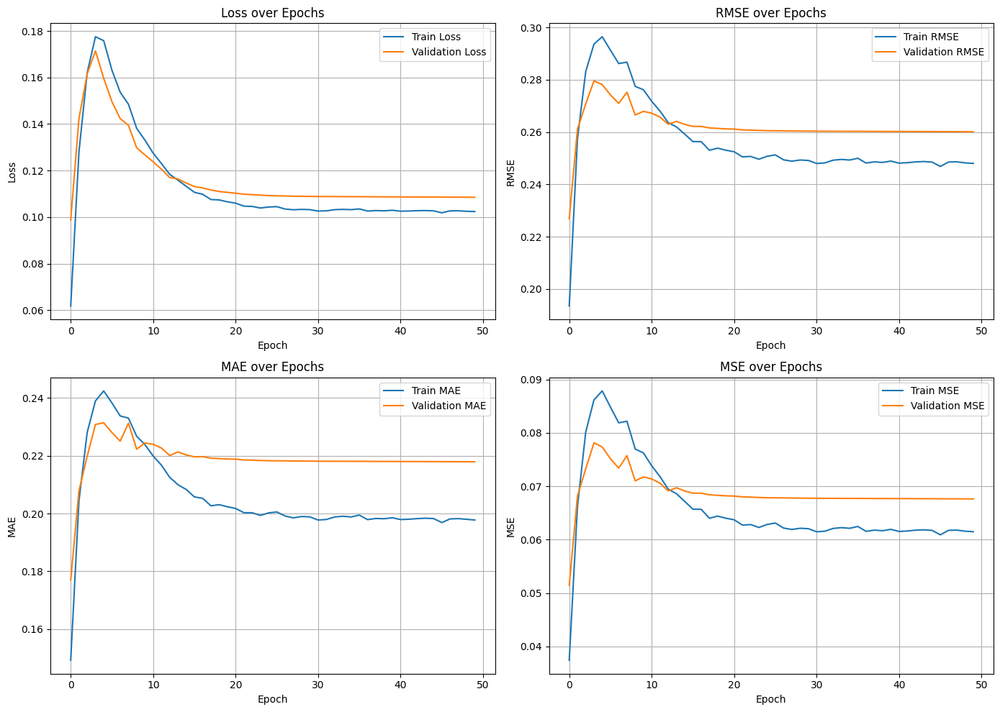

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# 1. Loss
axs[0, 0].plot(history.history['loss'], label='Train Loss')
axs[0, 0].plot(history.history['val_loss'], label='Validation Loss')
axs[0, 0].set_title('Loss over Epochs')
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].set_ylabel('Loss')
axs[0, 0].legend()
axs[0, 0].grid(True)

# 2. RMSE
axs[0, 1].plot(history.history['root_mean_squared_error'], label='Train RMSE')
axs[0, 1].plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
axs[0, 1].set_title('RMSE over Epochs')
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].set_ylabel('RMSE')
axs[0, 1].legend()
axs[0, 1].grid(True)

# 3. MAE
axs[1, 0].plot(history.history['mean_absolute_error'], label='Train MAE')
axs[1, 0].plot(history.history['val_mean_absolute_error'], label='Validation MAE')
axs[1, 0].set_title('MAE over Epochs')
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].set_ylabel('MAE')
axs[1, 0].legend()
axs[1, 0].grid(True)

# 4. MSE
axs[1, 1].plot(history.history['mean_squared_error'], label='Train MSE')
axs[1, 1].plot(history.history['val_mean_squared_error'], label='Validation MSE')
axs[1, 1].set_title('MSE over Epochs')
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].set_ylabel('MSE')
axs[1, 1].legend()
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

**1. Loss over Epochs**

* **Train dan validation loss** menunjukkan tren menurun yang stabil setelah puncaknya sekitar epoch ke-3 hingga ke-5.
* Setelah itu, **tidak ada overfitting yang signifikan**, karena *validation loss* mendatar dan cukup dekat dengan *train loss*.
* Ini indikasi bahwa model **belajar dengan baik dan generalisasi cukup bagus**.

---

**2. RMSE (Root Mean Square Error)**

* RMSE untuk train dan validation juga **menurun konsisten**, walau lebih lambat dari loss.
* Gap antara train dan validation RMSE relatif kecil setelah epoch ke-20.
* **RMSE mendatar di bawah 0.26**, artinya prediksi rating cukup akurat.

---

**3. MAE (Mean Absolute Error)**

* Sama seperti RMSE, MAE menunjukkan **penurunan awal yang tajam**, lalu stabil.
* Validation MAE sekitar **0.22**, cukup bagus.
* MAE lebih stabil dibanding RMSE, menunjukkan **jumlah prediksi error besar tidak terlalu banyak**.

---

**4. MSE (Mean Squared Error)**

* MSE lebih sensitif terhadap outlier dibanding MAE, tapi di sini **perilakunya mirip dan stabil**.
* Nilainya stabil di bawah **0.07** untuk validation, menunjukkan error kuadrat kecil.

---